In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [93]:
def display(image, flip=True, cmap=None, figsize=(6, 6), **kwargs):
    if flip:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # image.shape = (hieght, width, channels)
    width=image.shape[1] 
    height=image.shape[0]
    margin=50 
    # dots per inch
    dpi=100.
    # inches
    figsize=((width+2*margin)/dpi, (height+2*margin)/dpi)
    #axes ratio
    left = margin/dpi/figsize[0] 
    bottom = margin/dpi/figsize[1]
    fig = plt.figure(figsize=figsize, dpi=dpi)
    fig.subplots_adjust(left=left, bottom=bottom, right=1.-left, top=1.-bottom)
    # plt.figure(figsize=(6, 6))
    _ = plt.imshow(image, cmap=cmap)
    plt.title(kwargs.get("title", None))
    plt.axis("off")

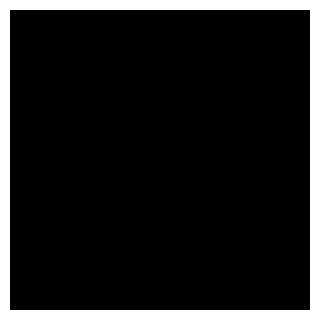

In [96]:
# create an empty canvas - black color
# 300x300, 3 channels
shape = (300, 300, 3)
canvas = np.zeros(shape, dtype="uint8")
display(canvas)

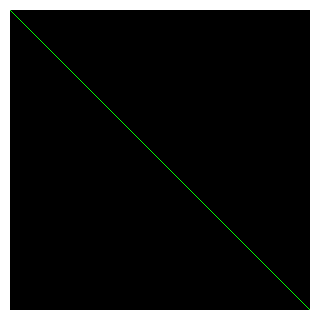

In [56]:
# draw line from top-left corner to bottom right
green = (0, 255, 0) # (B, G, R) format

cv2.line(canvas, (0, 0), (300, 300), green)
display(canvas)

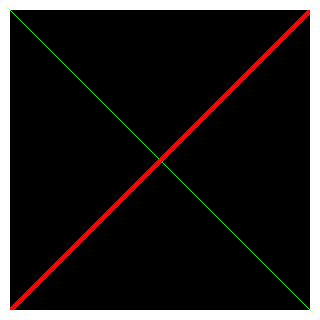

In [57]:
# draw another line with 3 pixels width, from top-right to bottom-left
red = (0, 0, 255) # (B, G, R) format
cv2.line(canvas, (0, 300), (300, 0), red, 3)
display(canvas)

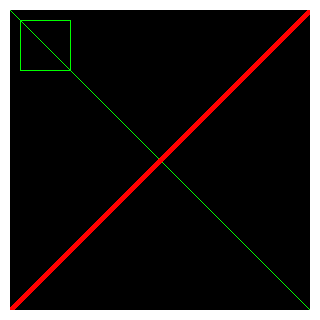

In [58]:
# drawing a 50x50 pixel square, start at 10x10 and end at 60x60
cv2.rectangle(canvas, (10, 10), (60, 60), green)
display(canvas)

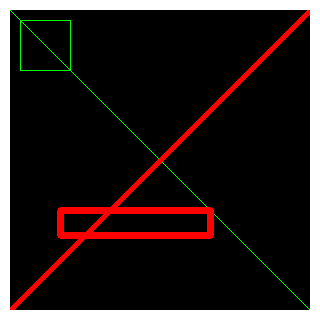

In [59]:
# draw another rectangle red color and 5 pixels thick
red = (0, 0, 255) # (B, G, R) format
cv2.rectangle(canvas, (50, 200), (200, 225), red, 5)
display(canvas)

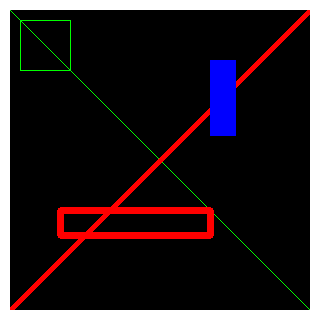

In [60]:
# draw another rectangle but filled instead of hollow
blue = (255, 0, 0)
cv2.rectangle(canvas, (200, 50), (225, 125), blue, -1)
display(canvas)

### Circles

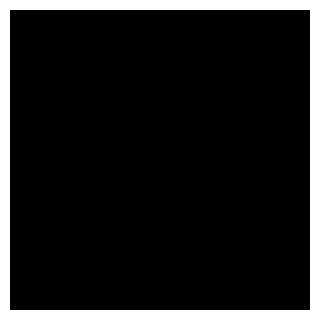

In [61]:
# blank canvas 
shape = (300, 300, 3)
canvas = np.zeros(shape, dtype="uint8")
display(canvas)

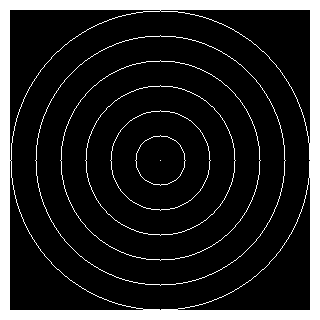

In [62]:
# draw a circle at center of canvas with increasing radii from 25 pixels to 150 pixels
# get center
(cX, cY) = (canvas.shape[1]//2, canvas.shape[0]//2)
white = (255, 255, 255)

for r in range(0, 175, 25):
    cv2.circle(canvas, (cX, cY), r, white)
display(canvas)

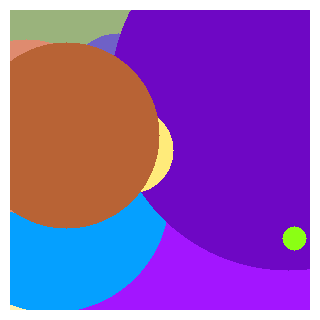

In [63]:
# draw 25 random circles
for i in range(0, 25):
    # random integer btw 5 and 200
    radius = np.random.randint(5, high=200)
    color = np.random.randint(0, high=300, size=(3, )).tolist()
    center = np.random.randint(0, high=300, size=(2, ))
    
    cv2.circle(canvas, tuple(center), radius, color, -1)
display(canvas)

### Translation

In [64]:
tx = 50 # number of pixels to shift in the X direction
ty = 50 # number of pixels to shift in the Y direction
translation_matrix = [[1, 0, tx],
                      [0, 1, ty]]

In [65]:
import imutils

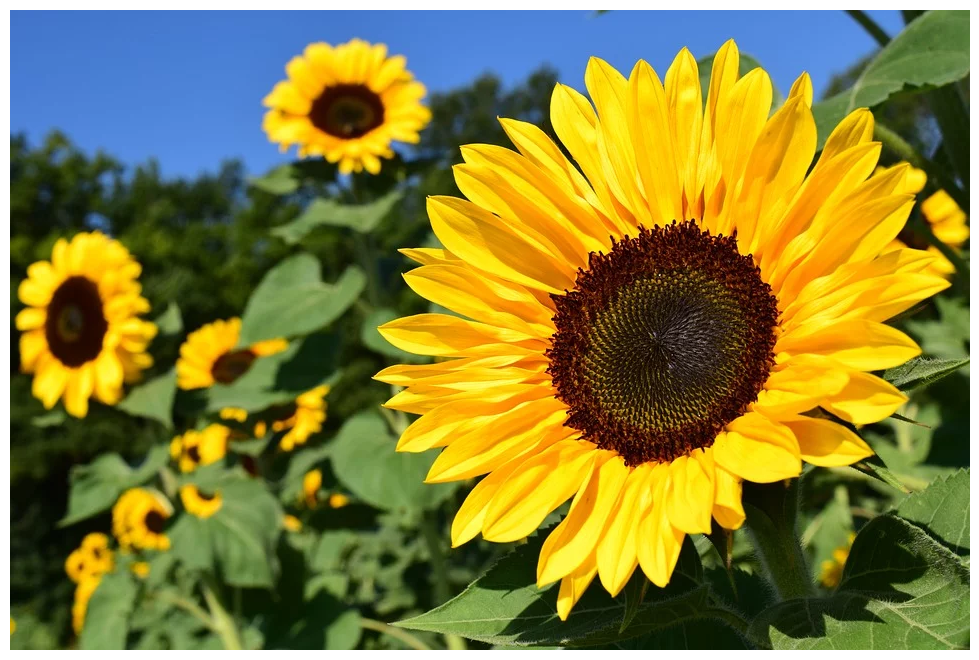

In [66]:
image = cv2.imread("sunflower.png")
display(image)

In [67]:
# translation matrix M
M = np.float32([[1, 0, 25], # 25 pixels to right
                [0, 1, 50]]) # 50 pixels to bottom

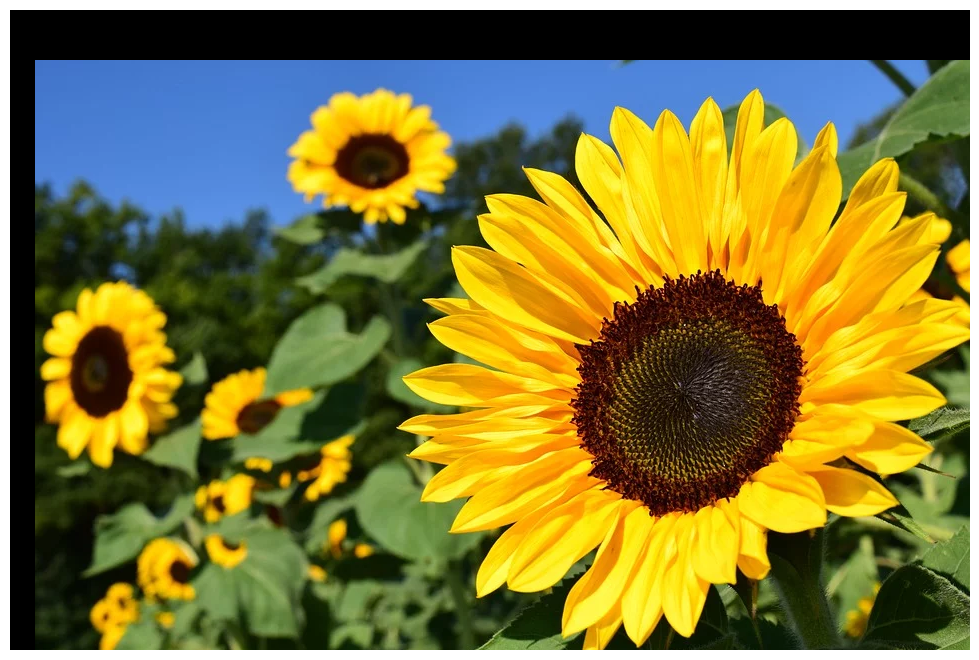

In [68]:
shifted = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))
display(shifted)

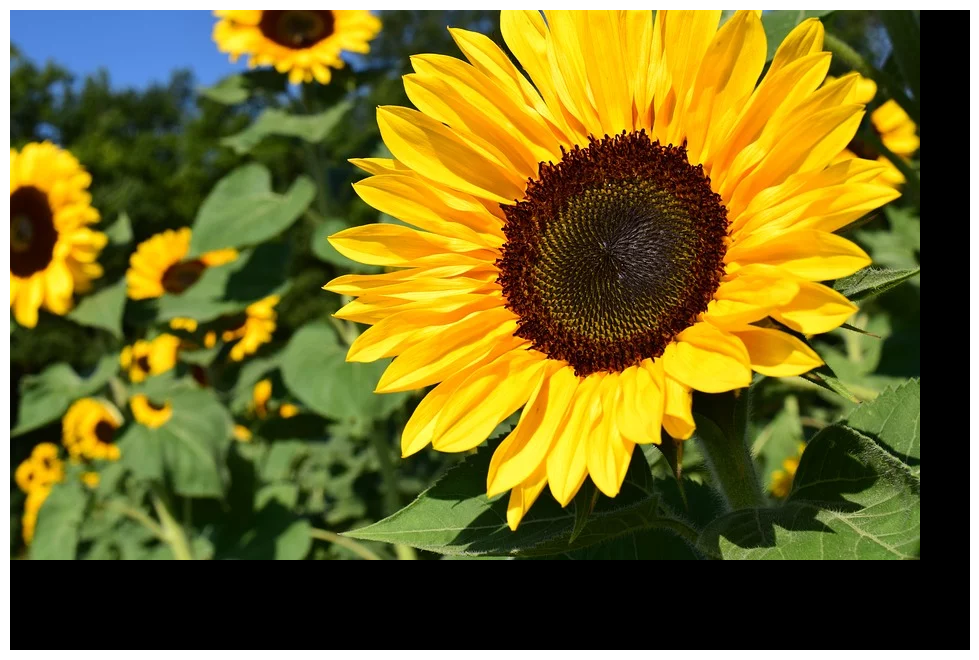

In [69]:
# shift up and left
# translation matrix M
M = np.float32([[1, 0, -50], # 50 pixels to left
                [0, 1, -90]]) # 90 pixels to up
shifted = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))
display(shifted)

In [70]:
# method builder around shifting
def translate(image, x, y):
    # define the translation matrix and perform the translation
    M = np.float32([[1, 0, x], [0, 1, y]])
    shifted = cv2.warpAffine(image, M, (image.shape[1], image.shape[0]))
    # return the translated image
    return shifted

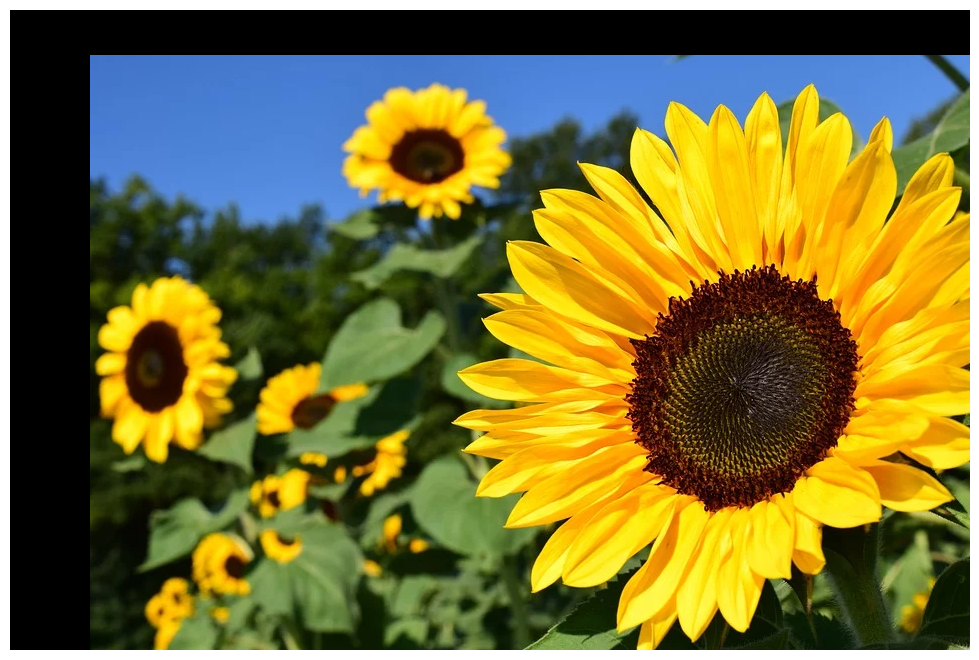

In [71]:
display(translate(image, 80, 45))

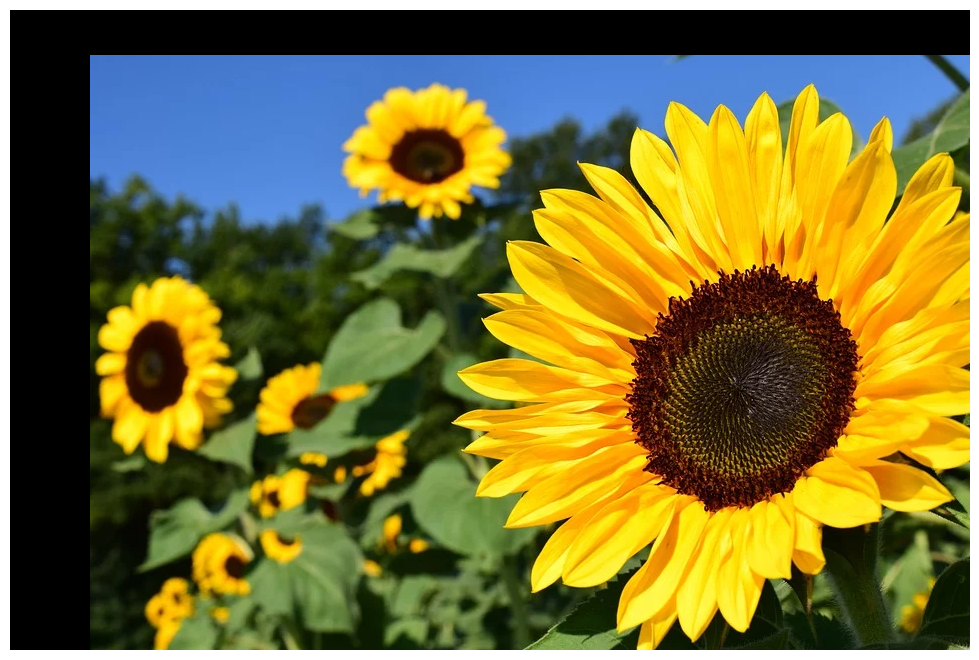

In [72]:
### imutils to the rescue
display(imutils.translate(image, 80, 45))

### Rotation

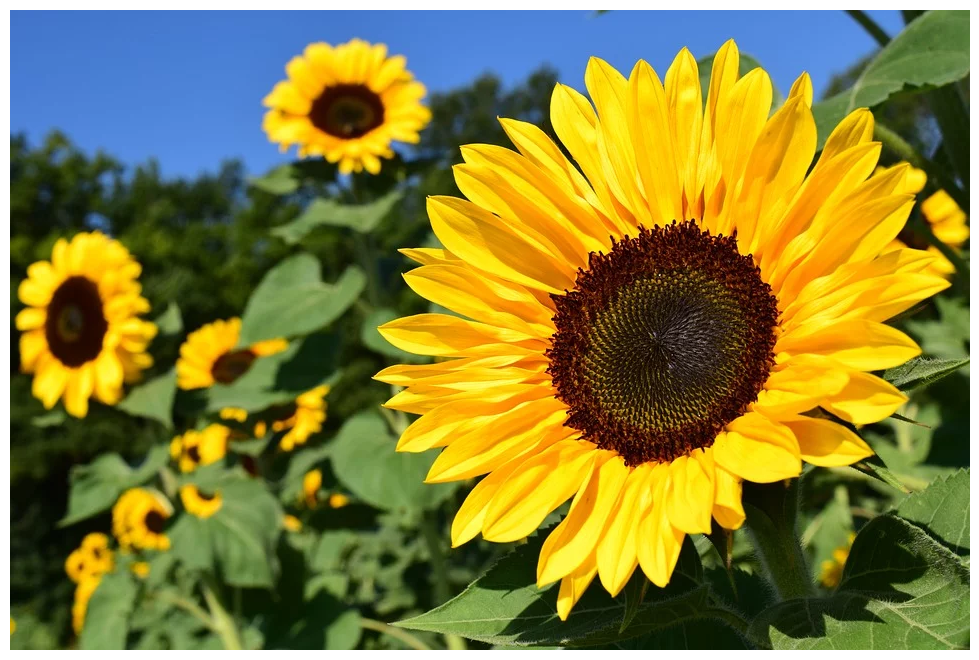

In [73]:
# image
display(image)

In [74]:
(h, w) = image.shape[:2]
(cX, cY) = (w/2, h/2)

cv2.getRotationMatrix2D - https://docs.opencv.org/2.4/modules/imgproc/doc/geometric_transformations.html#getrotationmatrix2d 

cv2.warpAffine - https://docs.opencv.org/2.4/modules/imgproc/doc/geometric_transformations.html?highlight=warpaffine#void%20warpAffine

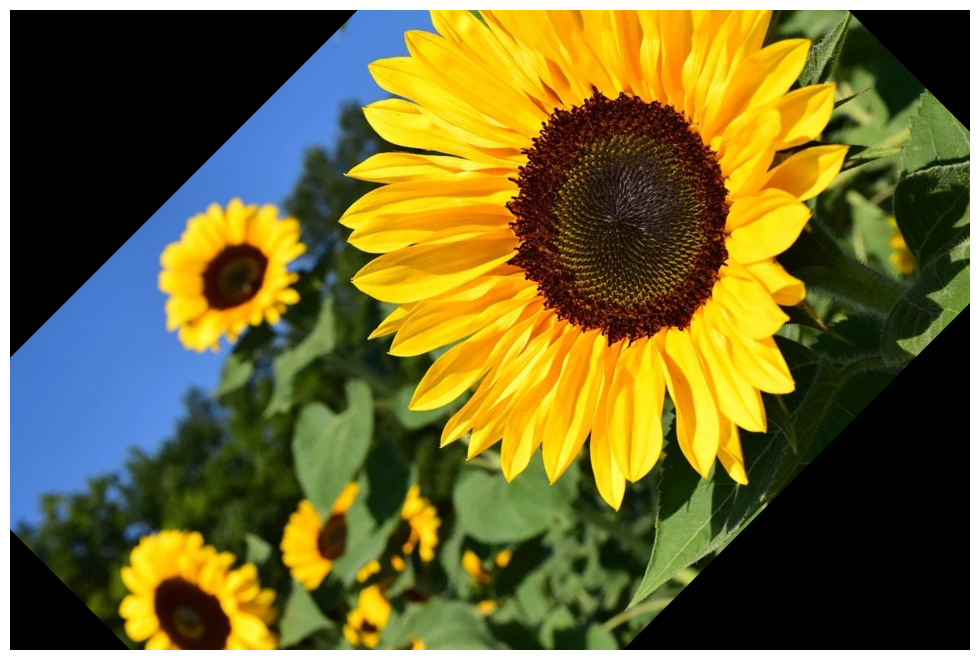

In [75]:
# rotate by 45 degrees
M = cv2.getRotationMatrix2D(center=(cX, cY), angle=45, scale=1.0)
rotated = cv2.warpAffine(src=image, M=M, dsize=(w, h))
display(rotated)

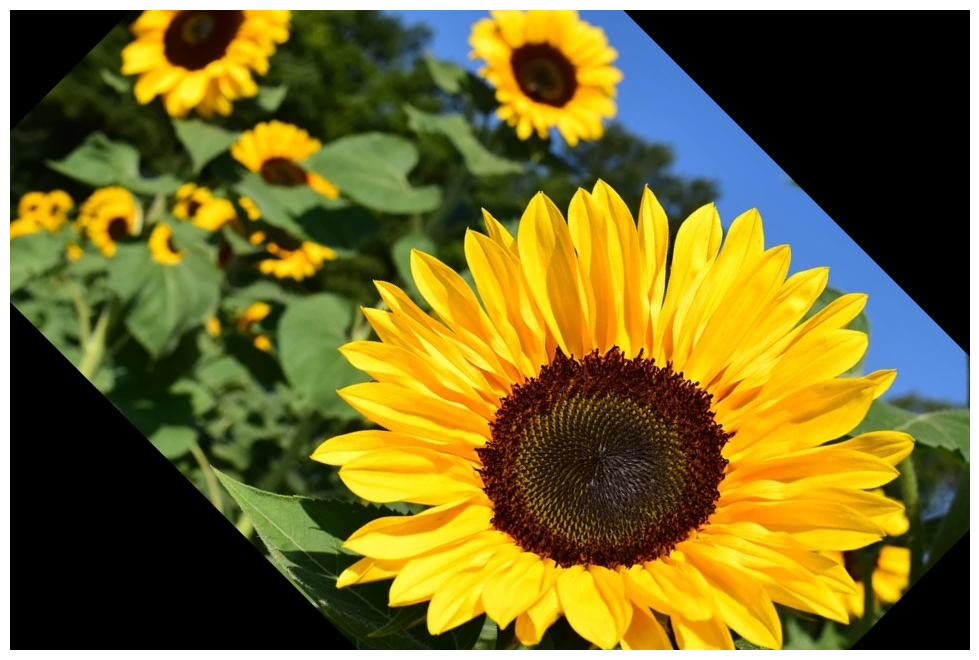

In [76]:
# rotate by -90 degrees
M = cv2.getRotationMatrix2D(center=(cX, cY), angle=-45, scale=1.0)
rotated = cv2.warpAffine(src=image, M=M, dsize=(w, h))
display(rotated)

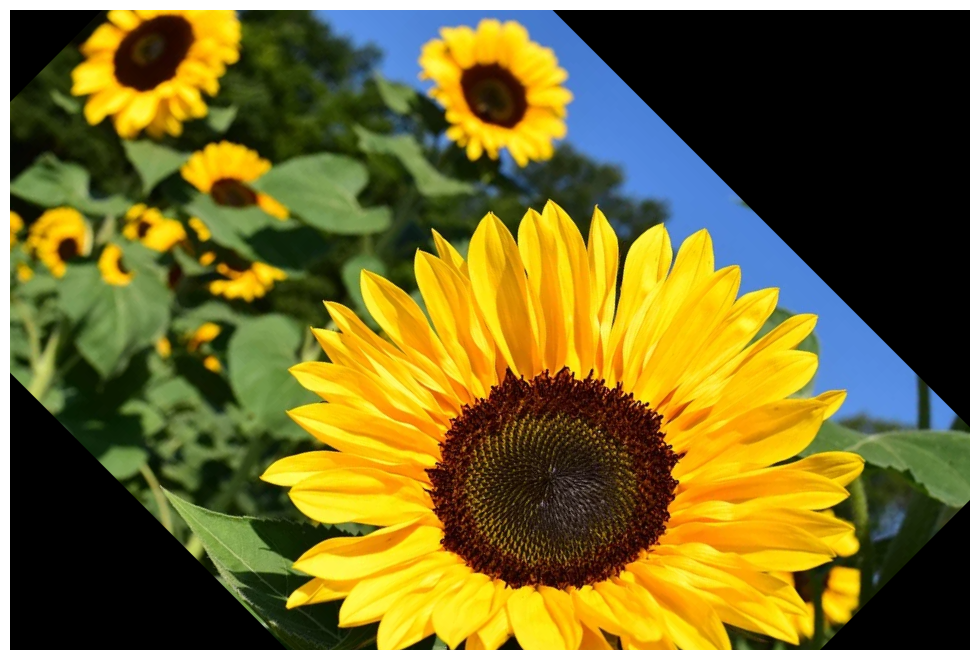

In [77]:
# rotate around an arbitary point
M = cv2.getRotationMatrix2D(
    center=(cX-50, cY-50),
    angle=-45,
    scale=1.0
)
rotated = cv2.warpAffine(
    src=image,
    M=M,
    dsize=(w, h)
)
display(rotated)

In [78]:
# method form 
def rotate(image, angle, center=None, scale=1.0):
    # dimensions
    (h, w) = image.shape[:2]
    # center
    if center is None:
        center = (w/2, h/2)
    # get M
    M = cv2.getRotationMatrix2D(center, angle, scale)
    # rotate
    rotated = cv2.warpAffine(image, M, (w, h))
    return rotated

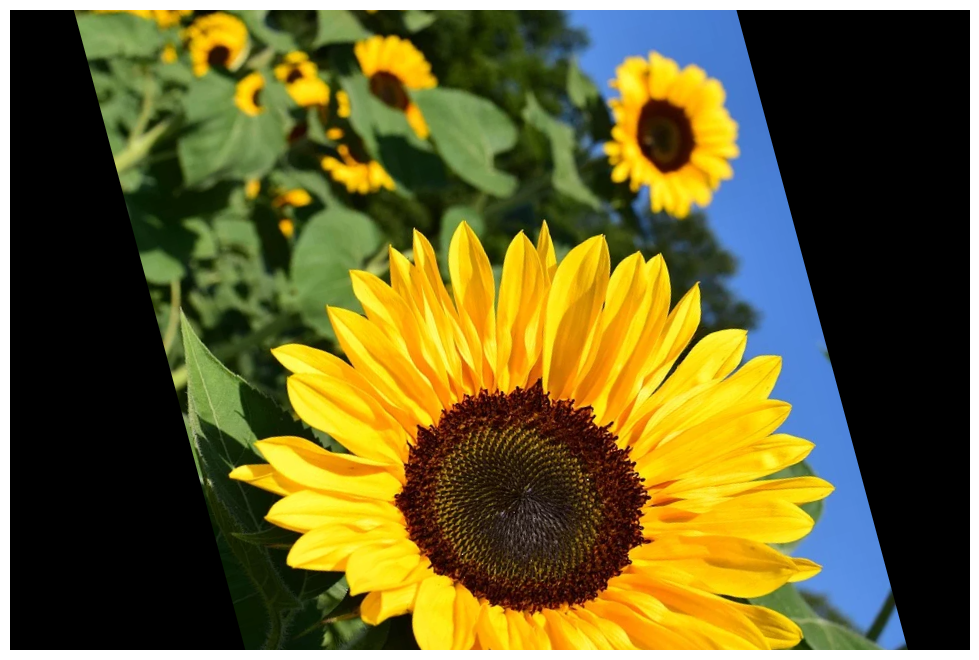

In [79]:
display(rotate(image, -75))

In [80]:
img = cv2.imread("wynn.png")
# print(img.shape)
rotated = rotate(img, 110, (50, 50))
rotated[10, 10]

array([ 79, 104,  42], dtype=uint8)

### Resizing

(640, 960, 3)


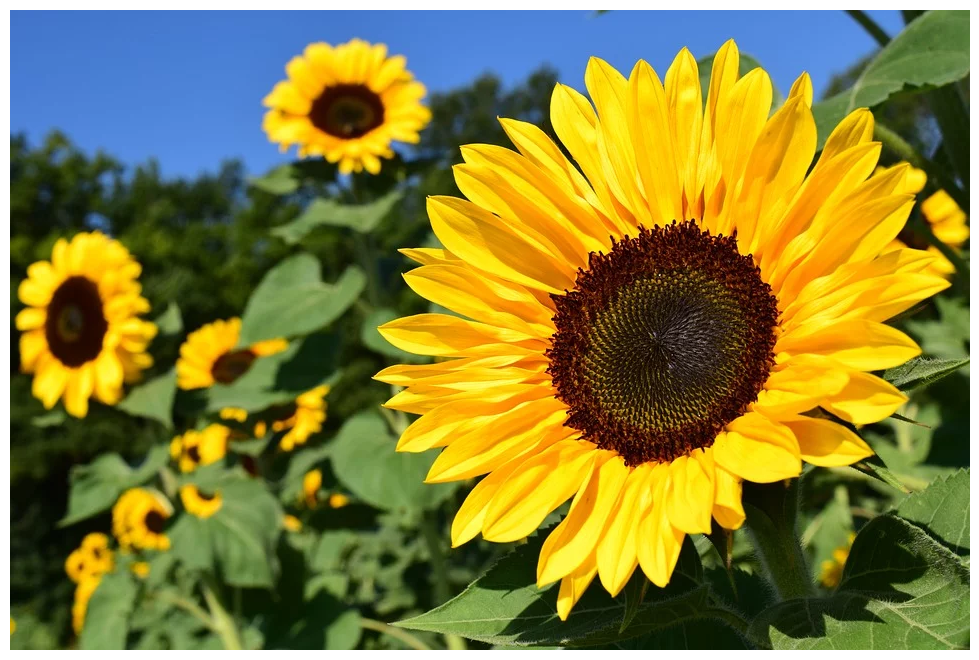

In [81]:
# image 
image = cv2.imread("sunflower.png")
print(image.shape)
display(image)

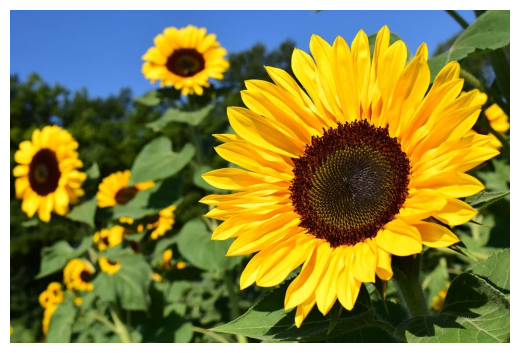

In [89]:
# change the width of image to 500
# image.shape = (hieght, width, channels)
width = 500.0
ratio = width/image.shape[1] 
dimensions = (int(width), int(image.shape[0] * ratio))
# resize
resized = cv2.resize(image, dimensions, interpolation=cv2.INTER_AREA)
display(resized)

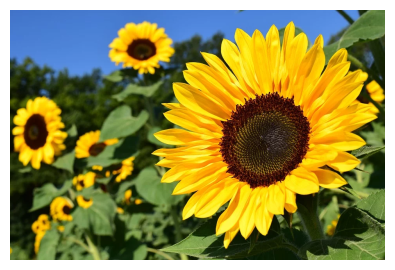

In [90]:
# change the hieght of image to 250
hieght = 250.0
# (hieght, width, channels)
ratio = hieght/image.shape[0]
dimensions = (int(image.shape[1] * ratio), int(hieght))
resized = cv2.resize(image, dimensions, interpolation=cv2.INTER_AREA)
display(resized)

In [97]:
# method for resizing

def resize(image, width=None, height=None, inter=cv2.INTER_AREA):
    # initialize the dimensions of the image to be resized and
    # grab the image size
    dim = None
    (h, w) = image.shape[:2]
    
    # if both the width and height are None, then return the
    # original image
    if width is None and height is None:
        return image
    
    # check to see if the width is None
    if width is None:
        # calculate the ratio of the height and construct the
        # dimensions
        r = height / float(h)
        dim = (int(w * r), height)
    # otherwise, the height is None
    else:
        # calculate the ratio of the width and construct the
        # dimensions
        r = width / float(w)
        dim = (width, int(h * r))
    # resize the image
    resized = cv2.resize(image, dim, interpolation=inter)
    # return the resized image
    return resized

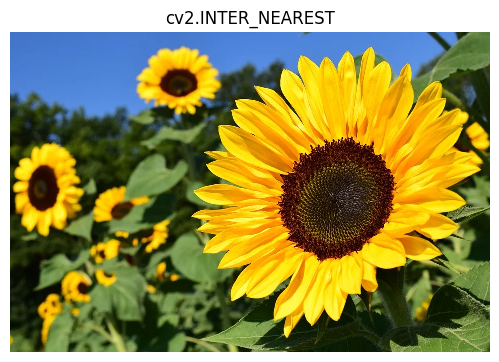

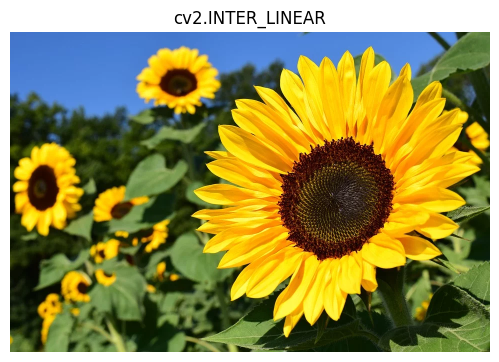

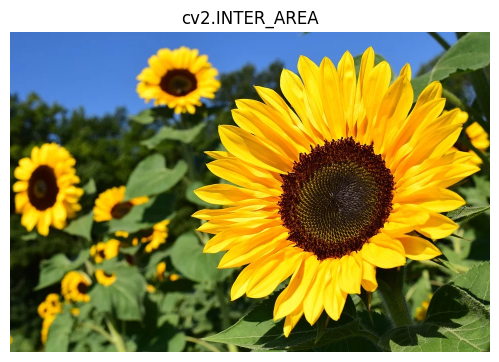

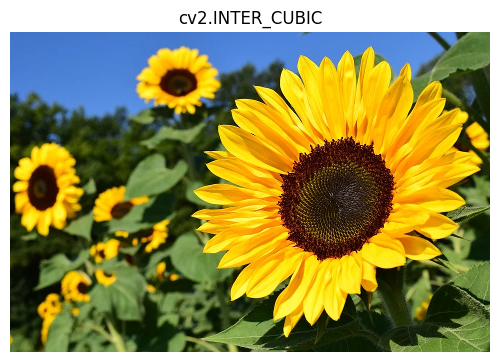

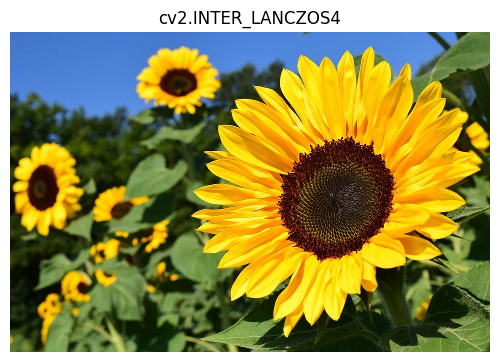

In [105]:
# construct the list of interpolation methods
methods = [
    ("cv2.INTER_NEAREST", cv2.INTER_NEAREST),
    ("cv2.INTER_LINEAR", cv2.INTER_LINEAR),
    ("cv2.INTER_AREA", cv2.INTER_AREA),
    ("cv2.INTER_CUBIC", cv2.INTER_CUBIC),
    ("cv2.INTER_LANCZOS4", cv2.INTER_LANCZOS4)
]
 
# loop over the interpolation methods
for (name, method) in methods:
    # increase the size of the image by 3x using the current interpolation
    # method
    resized = resize(image, width=int(image.shape[1] / 2), inter=method)
    display(resized, title=name)

(188, 250, 3)


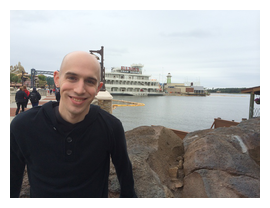

In [109]:
image = cv2.imread("florida_trip_small.png")
print(image.shape)
display(image)

In [111]:
resized = resize(image, width=100, inter=cv2.INTER_NEAREST)
resized[74, 20]

array([26, 19, 16], dtype=uint8)

In [112]:
resized = resize(image, width= 250*2, inter=cv2.INTER_NEAREST)
resized[367, 170]

array([25, 20, 20], dtype=uint8)

### Flipping 

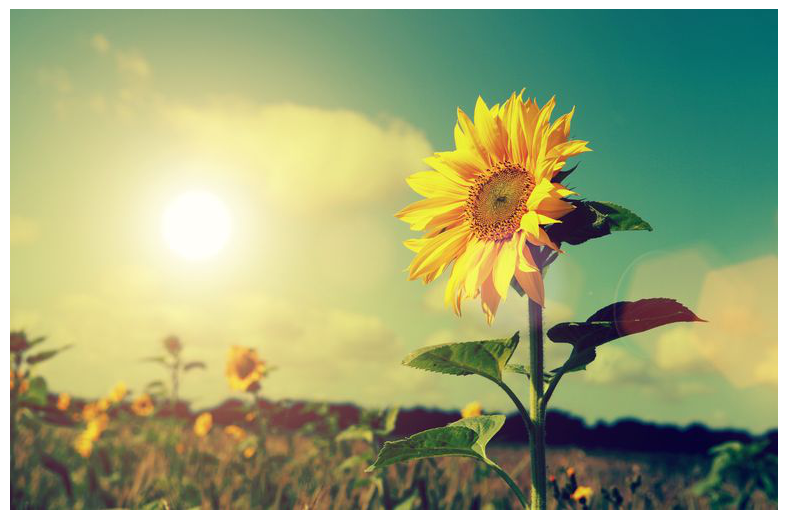

In [114]:
image = cv2.imread("sunflower2.png")
display(image)

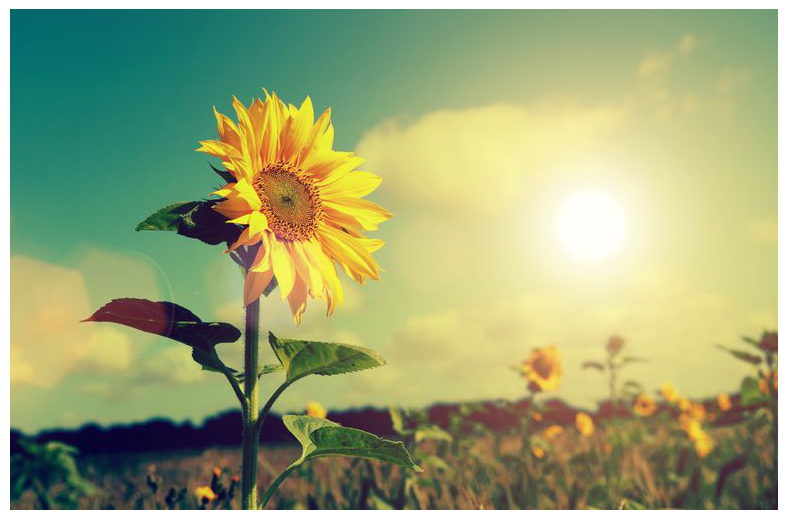

In [116]:
# flip horizontally 
flipped = cv2.flip(image, 1)
display(flipped)

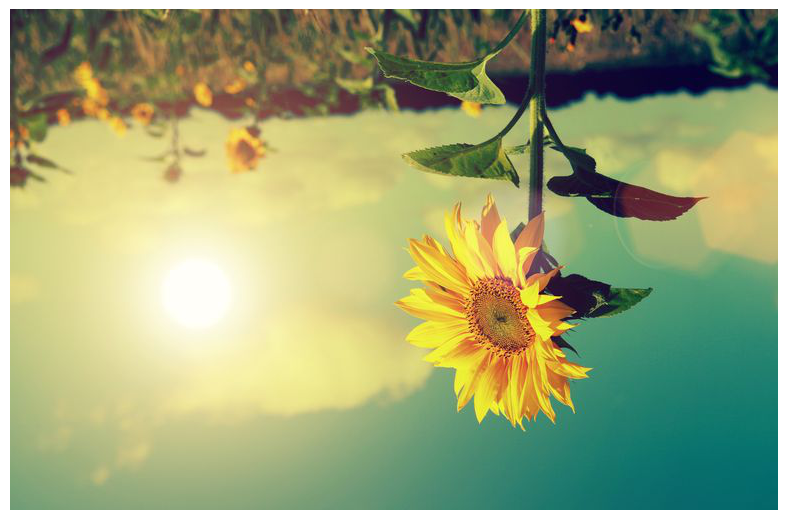

In [117]:
# flip vertically
flipped = cv2.flip(image, 0)
display(flipped)

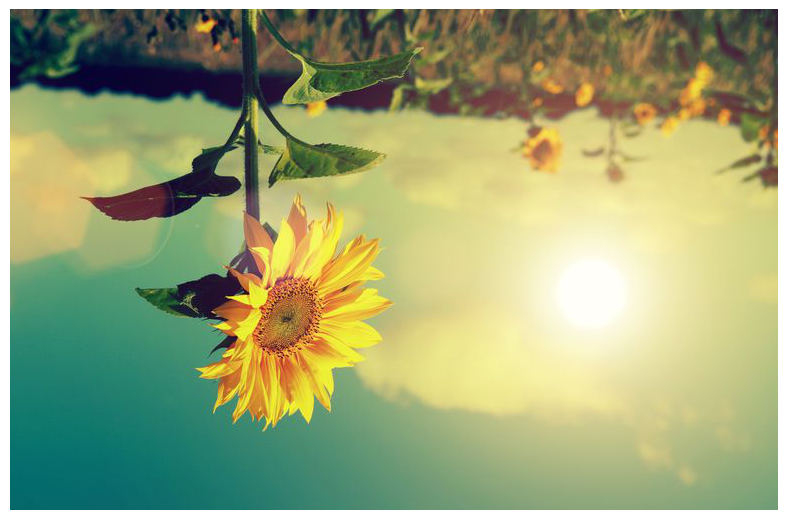

In [118]:
# flip along both axis
flipped = cv2.flip(image, -1)
display(flipped)

In [128]:
image = cv2.imread("florida_trip.png")
flipped = cv2.flip(image, 1)
flipped[235, 259]

array([189, 192, 183], dtype=uint8)

In [127]:
rotated = rotate(image=flipped, angle=45)
f = cv2.flip(rotated, 0)
f[189, 441]

array([24, 19, 18], dtype=uint8)

### Cropping 

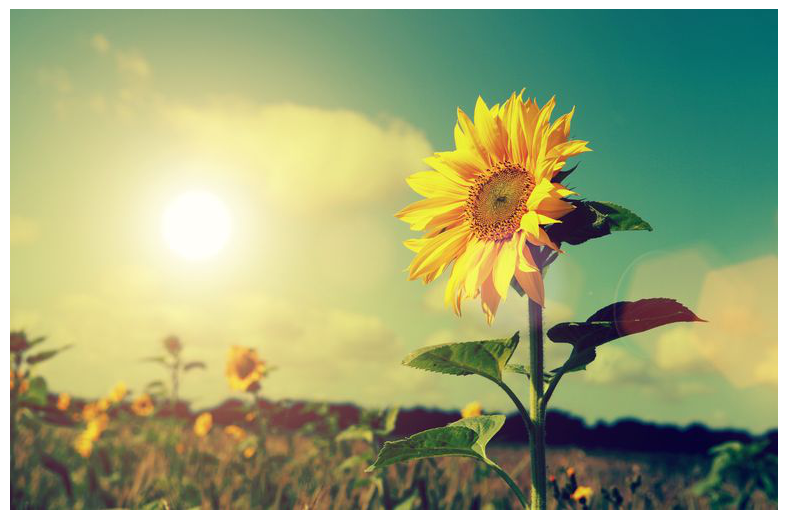

In [131]:
image = cv2.imread("sunflower2.png")
display(image)

### Slicing Numpy Array Concepts 
<code>
ROI = image[startY:endY, startX:endX]

</code>

The order in which we supply the indexes to the crop may seem counterintuitive; however, remember that OpenCV represents images as NumPy arrays with the the height first and the width second. This means that we need to supply our y-axis values before our x-axis.

numpy image representation = (hieght, width)

 - Start y: The starting y coordinate. In this case, we start at y=85.
 - End y: The ending y coordinate. We will end our crop at y=250.
 - Start x: The starting x coordinate of the slice. We start the crop at x=85.
 - End x: The ending x-axis coordinate of the slice. Our slice ends at x=220.

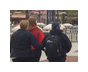

In [134]:
image = cv2.imread("florida_trip.png")
display(image[124:212, 225:])